In [4]:
pip install keras==2.2.4 # 需要安裝 keras 2.2.4 的版本

     |████████████████████████████████| 317kB 2.5MB/s 
  Found existing installation: Keras 2.2.5
    Uninstalling Keras-2.2.5:
      Successfully uninstalled Keras-2.2.5


In [5]:
%tensorflow_version 1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2
import tensorflow as tf
print(tf.__version__)
import os
from os import getcwd
import xml.etree.ElementTree as ET # 載入能夠 Parser xml 文件的 library
import pandas as pd
import random

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.
1.15.0


In [6]:
from google.colab import drive 
drive.mount('/content/gdrive') # 將 google drive 掛載在 colob，
# 下載基於 keras 的 yolov3 程式碼
%cd 'gdrive/My Drive'
# !git clone https://github.com/qqwweee/keras-yolo3 # 如果之前已經下載過就可以註解掉
%cd keras-yolo3

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
/content/gdrive/My Drive
/content/gdrive/My Drive/keras-yolo3


In [7]:
if not os.path.exists("model_data/yolo.h5"):
    # 下載 yolov3 的網路權重，並且把權重轉換為 keras 能夠讀取的格式
    print("Model doesn't exist, downloading...")
    os.system("wget https://pjreddie.com/media/files/yolov3.weights")
    print("Converting yolov3.weights to yolo.h5...")
    os.system("python convert.py yolov3.cfg yolov3.weights model_data/yolo.h5")
else:
    print("Model exist")

Model exist


### 資料集
* 袋鼠資料集總共有183張圖片(後來發現圖片有少，實際只有164張)，我預計使用16張(隨機選取)當驗證集，剩下的都當訓練集
* 浣熊資料集則有200張圖片，原本作者就有拆分成160張當作訓練集，40張當測試集，但圖片數量過少，因此將那40張直接當成驗證集
* 最後我將兩者資料融合，訓練集共 325 張(165袋鼠+160浣熊)，驗證集共 58 張(18袋鼠+40浣熊)，測試集則由作業提供的影片當測試
* annotation file 則是參考 keras-yolo3 之前轉換 Pascal dataset 的程式碼，更改一下檔案路徑，產生成袋鼠與浣熊的 annotation file

|   |袋鼠|浣熊|總張數|
|---|---|---|---|
|訓練集|148|160|308|
|驗證集|16|40|56|
|總張數|164|200|364|

In [0]:
# 讀取已分好的浣熊資料集
df_raccoon_train = pd.read_csv('./dataset/raccoon/train_labels.csv')
train_raccoon = df_raccoon_train['filename'].unique().tolist()
df_raccoon_test = pd.read_csv('./dataset/raccoon/test_labels.csv')
test_raccoon = df_raccoon_test['filename'].unique().tolist()

In [0]:
# 袋鼠 16張 浣熊 16張
df_raccoon_all = pd.read_csv('./dataset/raccoon_labels.csv')
all_raccoon = df_raccoon_all['filename'].unique().tolist()
test_raccoon = random.sample(all_raccoon, 16)

train_raccoon = all_raccoon
for elem in test_raccoon:
    train_raccoon.remove(elem)

In [12]:
# 讀取所有的袋鼠資料集，再隨機選取 16 張當測試集
all_kangaroo = os.listdir('./dataset/kangaroo/images')
test_kangaroo = random.sample(all_kangaroo, 16)
train_kangaroo = all_kangaroo
for elem in test_kangaroo:
    train_kangaroo.remove(elem)

print('Kangaroo: {}/{}'.format(len(train_kangaroo), len(test_kangaroo)))
print('Raccoon: {}/{}'.format(len(train_raccoon), len(test_raccoon)))

Kangaroo: 148/16
Raccoon: 184/16


In [14]:
train_data = train_kangaroo + train_raccoon
test_data = test_kangaroo + test_raccoon
print('dataset: {}/{}'.format(len(train_data), len(test_data)))

dataset: 332/32


In [0]:
train_list = open('./dataset/train_list.txt', 'w')
test_list = open('./dataset/test_list.txt', 'w')

for data in train_data:
    train_list.write(data.split('.')[0])
    train_list.write('\n')
    
for data in test_data:
    test_list.write(data.split('.')[0])
    test_list.write('\n')
    
train_list.close()
test_list.close()

In [51]:
# 範例中訓練模型時所使用的，已經做好轉換的 annotation 檔名，增加這個檢查避免每次重新跑這段轉換的程式碼

if not os.path.exists("model_tejt.txt"):
    sets = ['train', 'test']

    # 定義資料類別
    classes = ["kangaroo", "raccoon"]

    # 把 annotation 轉換訓練時需要的資料形態
    def convert_annotation(image_id, list_file):
        in_file = open('dataset/annotations/%s.xml' % (image_id))
        tree = ET.parse(in_file)
        root = tree.getroot()

        for obj in root.iter('object'):
            difficult = obj.find('difficult').text
            cls = obj.find('name').text
            if cls not in classes or int(difficult) == 1:
                print("%s don't record." % (image_id))
                continue
            
            cls_id = classes.index(cls)
            xmlbox = obj.find('bndbox')
            b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
            list_file.write(" " + ",".join([str(a) for a in b]) + ',' + str(cls_id))

    wd = "."

    for image_set in sets:
        image_ids = open('dataset/%s_list.txt'%(image_set)).read().strip().split()
        annotation_path = 'model_%s.txt'%(image_set)
        list_file = open(annotation_path, 'w')
        print("save annotation at %s" % annotation_path)
        for image_id in image_ids: # 只處理 100 張圖片來做範例
            list_file.write('%s/dataset/images/%s.jpg'%(wd, image_id))
            convert_annotation(image_id, list_file)
            list_file.write('\n')
        list_file.close()

save annotation at model_train.txt
save annotation at model_test.txt


In [18]:
# 將 train.py 所需要的套件載入
import numpy as np
import keras.backend as K
from keras.layers import Input, Lambda
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

Using TensorFlow backend.


In [0]:
from train import get_classes, get_anchors, create_model, create_tiny_model, data_generator, data_generator_wrapper

In [20]:
if not os.path.exists("model_data/yolo_weights.h5"):
    print("Converting pretrained YOLOv3 weights for training")
    os.system("python convert.py -w yolov3.cfg yolov3.weights model_data/yolo_weights.h5") 
else:
    print("Pretrained weights exists")

Pretrained weights exists


In [16]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

annotation_path = 'model_train.txt' # 轉換好格式的標註檔案
log_dir = 'logs_2/000/' # 訓練好的模型儲存的路徑
classes_path = 'dataset/my_classes.txt'
anchors_path = 'model_data/yolo_anchors.txt'
class_names = get_classes(classes_path)
num_classes = len(class_names)
anchors = get_anchors(anchors_path)

input_shape = (416,416) # multiple of 32, hw

is_tiny_version = len(anchors)==6 # default setting
if is_tiny_version:
    model = create_tiny_model(input_shape, anchors, num_classes,
        freeze_body=2, weights_path='model_data/tiny_yolo_weights.h5')
else:
    model = create_model(input_shape, anchors, num_classes,
        freeze_body=2, weights_path='model_data/yolo_weights.h5') # make sure you know what you freeze

logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
    monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

# 分為 training 以及 validation
val_split = 0.1
with open(annotation_path) as f:
    lines = f.readlines()
np.random.seed(10101)
np.random.shuffle(lines)
np.random.seed(None)
num_val = int(len(lines)*val_split)
num_train = len(lines) - num_val

# Train with frozen layers first, to get a stable loss.
# Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
# 一開始先 freeze YOLO 除了 output layer 以外的 darknet53 backbone 來 train
if True:
    model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 16
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    # 模型利用 generator 產生的資料做訓練，強烈建議大家去閱讀及理解 data_generator_wrapper 在 train.py 中的實現
    model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
            validation_steps=max(1, num_val//batch_size),
            epochs=50,
            initial_epoch=0,
            callbacks=[logging, checkpoint])
    model.save_weights(log_dir + 'trained_weights_stage_1.h5')

# Unfreeze and continue training, to fine-tune.
# Train longer if the result is not good.
if True:
    # 把所有 layer 都改為 trainable
    for i in range(len(model.layers)):
        model.layers[i].trainable = True
    model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
    print('Unfreeze all of the layers.')

    batch_size = 16 # note that more GPU memory is required after unfreezing the body
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
        steps_per_epoch=max(1, num_train//batch_size),
        validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
        validation_steps=max(1, num_val//batch_size),
        epochs=100,
        initial_epoch=50,
        callbacks=[logging, checkpoint, reduce_lr, early_stopping])
    model.save_weights(log_dir + 'trained_weights_final.h5')

Create YOLOv3 model with 9 anchors and 2 classes.


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((1, 1, 1024, 21) vs (255, 1024, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((1, 1, 512, 21) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_75 due to mismatch in shape ((1,

Load weights model_data/yolo_weights.h5.
Freeze the first 249 layers of total 252 layers.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Train on 278 samples, val on 30 samples, with batch size 16.




Epoch 1/50
17/17 [==============================] - 255s 15s/step - loss: 3973.2712 - val_loss: 1296.4355

Epoch 2/50
17/17 [==============================] - 231s 14s/step - loss: 707.1948 - val_loss: 359.3375
Epoch 3/50
17/17 [==============================] - 231s 14s/step - loss: 292.1361 - val_loss: 202.1779
Epoch 4/50
17/17 [==============================] - 227s 13s/step - loss: 194.9308 - val_loss: 141.0852
Epoch 5/50
17/17 [==============================] - 231s 14s/step - loss: 149.8438 - val_loss: 128.6232
Epoch 6/50
17/17 [==============================] - 233s 14s/step - loss: 120.9580 - val_loss: 101.8997
Epoch 7/50
17/17 [==============================] - 230s 14s/step - loss: 107.2316 - val_loss: 100.2141
Epoch 8/50
17/17 [

In [0]:
import cv2
from matplotlib.pyplot import imshow

%matplotlib inline

In [0]:
import matplotlib.pyplot as plt

In [69]:
from yolo import YOLO
log_dir = 'logs_2/000/'
classes_path = 'dataset/my_classes.txt'
yolo_model = YOLO(model_path=log_dir + 'trained_weights_final.h5', classes_path=classes_path)

logs_2/000/trained_weights_final.h5 model, anchors, and classes loaded.


In [0]:
test_path = 'model_test.txt' 
with open(test_path) as f:
    lines = f.readlines()

In [0]:
from PIL import Image, ImageDraw

In [0]:
def draw_box(img, boxes):
    draw = ImageDraw.Draw(img)
    
    for box in boxes:
        shape = [(int(box[0]), int(box[1])), (int(box[2]), int(box[3]))]
        draw.rectangle(shape, outline='blue')
        
    del draw
        
    return img

In [71]:
imgs = []
for line in lines:
    data = line.split(' ')
    img_path = data[0]
    img = Image.open(img_path)
    res = yolo_model.detect_image(img)

    boxes = []
    classes = []

    for row in data[1:]:
        box = row.replace('\n', '').split(',')
        boxes.append((box[0], box[1], box[2], box[3]))
        classes.append(box[4])

    res = draw_box(res, boxes)
    imgs.append(res)

(416, 416, 3)
Found 2 boxes for img
kangaroo 0.88 (131, 225) (323, 415)
kangaroo 0.99 (275, 97) (492, 358)
2.402186253999389
(416, 416, 3)
Found 2 boxes for img
raccoon 0.98 (23, 155) (337, 388)
kangaroo 0.99 (388, 0) (611, 337)
0.8469675630003621
(416, 416, 3)
Found 3 boxes for img
kangaroo 0.35 (204, 179) (696, 449)
kangaroo 0.93 (103, 63) (705, 533)
kangaroo 1.00 (35, 89) (509, 397)
0.8566261020005186
(416, 416, 3)
Found 1 boxes for img
kangaroo 1.00 (163, 20) (363, 380)
0.8457345749993692
(416, 416, 3)
Found 3 boxes for img
kangaroo 0.59 (111, 234) (251, 290)
kangaroo 0.87 (95, 199) (286, 299)
kangaroo 0.97 (399, 157) (520, 279)
0.8706662580007105
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.93 (170, 58) (449, 223)
0.8388813319998008
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.85 (100, 133) (811, 595)
0.8655283759999293
(416, 416, 3)
Found 4 boxes for img
kangaroo 0.77 (774, 0) (1009, 572)
kangaroo 0.97 (0, 0) (240, 576)
kangaroo 0.99 (159, 0) (415, 576)
kangaroo 0.99 (391, 47

In [72]:
len(imgs)

56

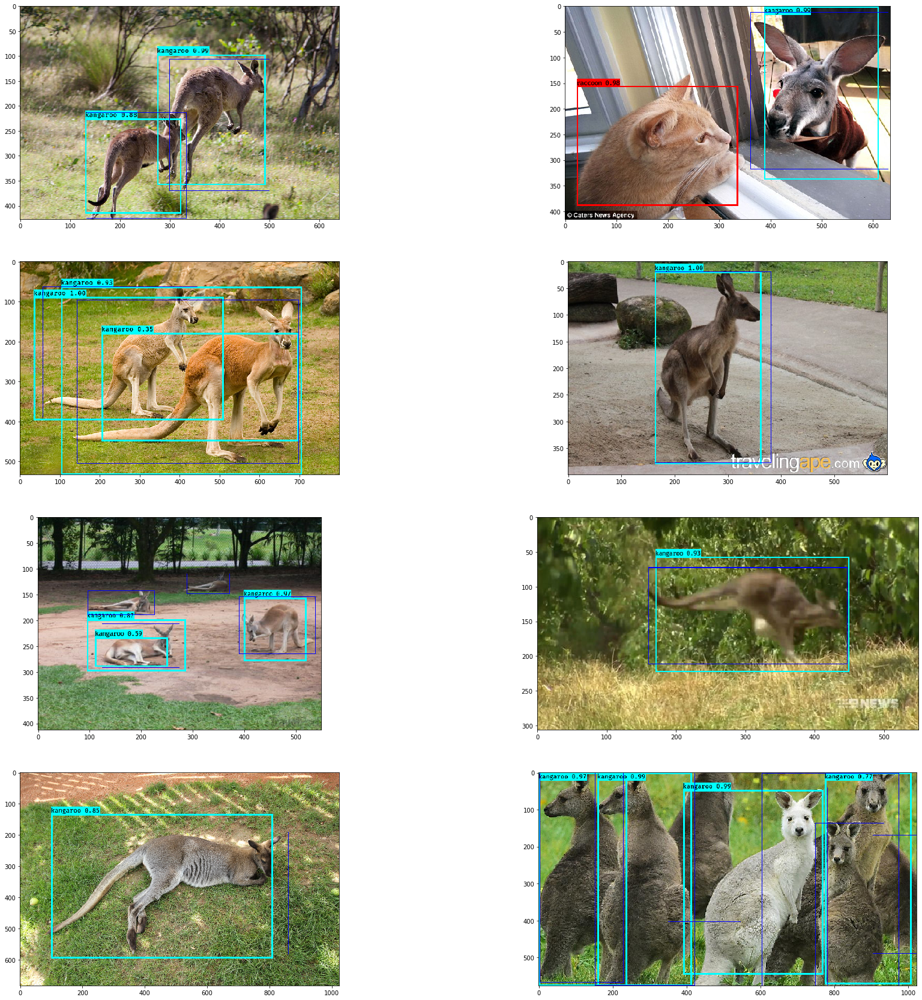

In [73]:
plt.figure(figsize=(30,30))
for i in range(1, 9):
  plt.subplot(4, 2, i)
  imshow(imgs[i - 1])

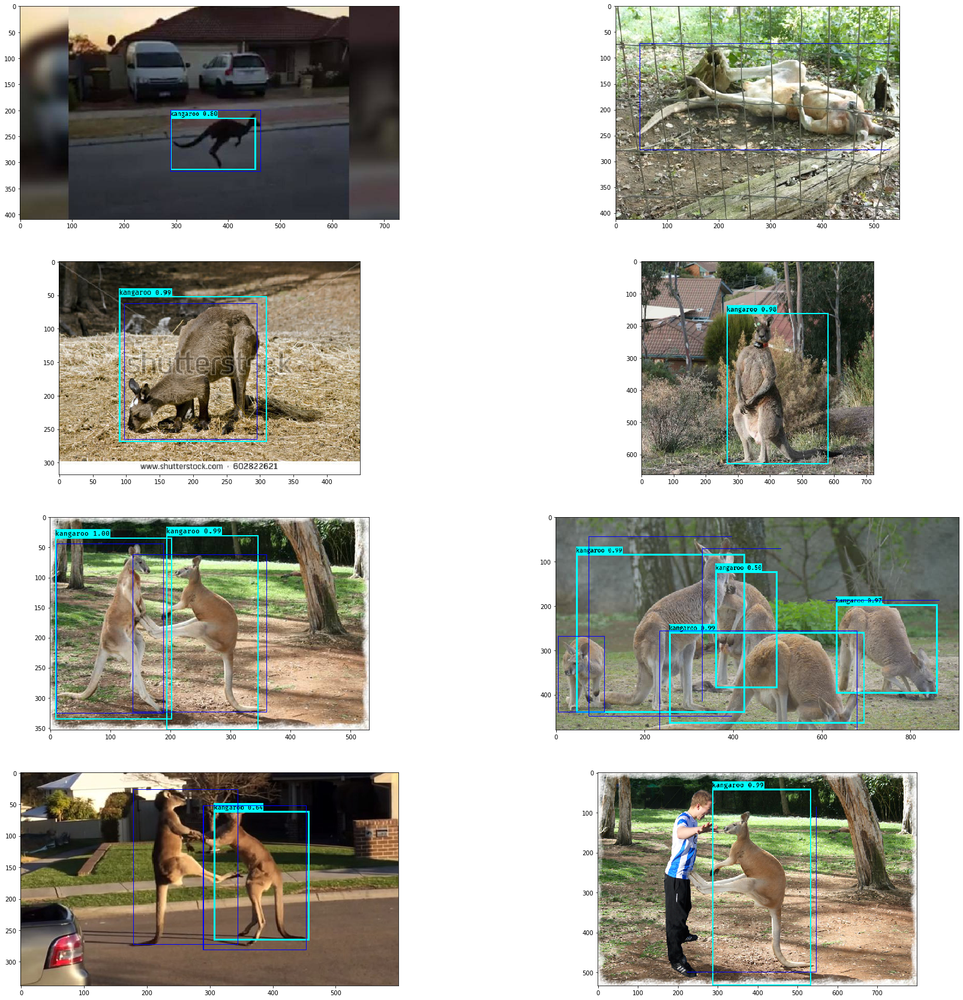

In [74]:
plt.figure(figsize=(30,30))
for i in range(1, 9):
  plt.subplot(4, 2, i)
  imshow(imgs[i + 7])

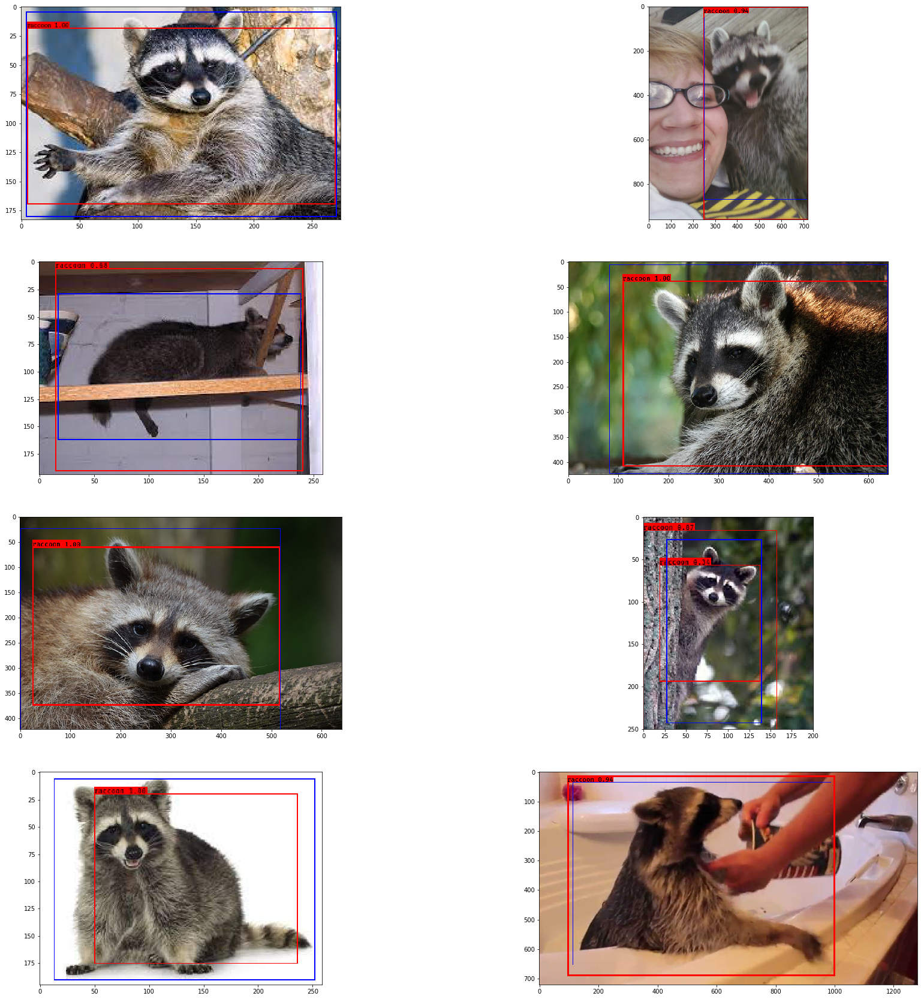

In [75]:
plt.figure(figsize=(30,30))
for i in range(1, 9):
  plt.subplot(4, 2, i)
  imshow(imgs[i + 15])

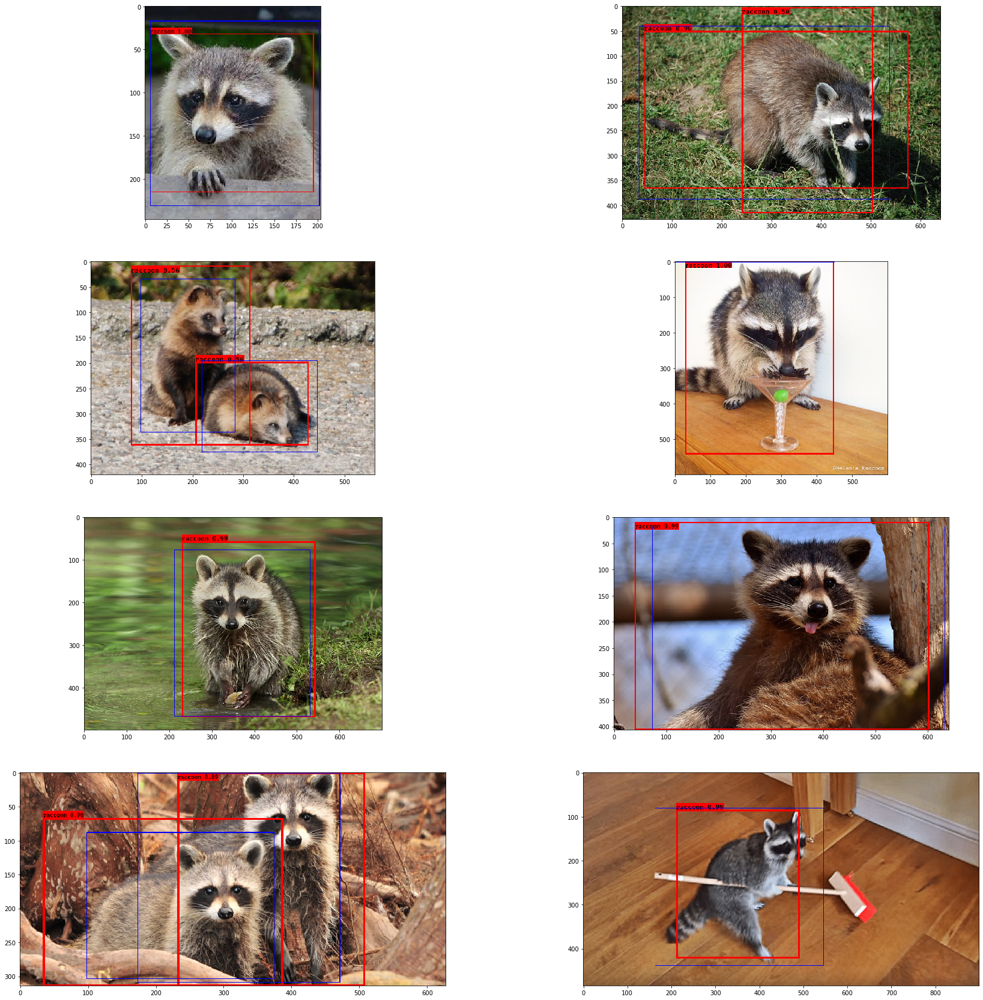

In [76]:
plt.figure(figsize=(30,30))
for i in range(1, 9):
  plt.subplot(4, 2, i)
  imshow(imgs[i + 23])

In [0]:
video_path = './dataset/test/Kangaroo.mp4'
output_path = './dataset/test/'
VIDEO_SAVE_DIR = './dataset/test/'
capture = cv2.VideoCapture(video_path) 
batch_size = 2

out = cv2.VideoWriter(output_path, video_FourCC, video_fps, video_size)

while True:
    ret, frame = capture.read()
    # Bail out when the video file ends
    if not ret:
        break        
    # Save each frame of the video to a list
    frame_count += 1

    image = Image.fromarray(frame)
    image = yolo_model.detect_image(image)
    result = np.asarray(image)

    curr_time = timer()
    exec_time = curr_time - prev_time
    prev_time = curr_time
    accum_time = accum_time + exec_time
    curr_fps = curr_fps + 1
    if accum_time > 1:
        accum_time = accum_time - 1
        fps = "FPS: " + str(curr_fps)
        curr_fps = 0

    out.write(result)


    frames.append(frame)
    if len(frames) == batch_size:
        results = yolo_model.detect_image(frames)
        results = model.detect(frames, verbose=0)
        for i, item in enumerate(zip(frames, results)):
            frame = item[0]
            r = item[1]
            frame = display_instances(
                frame, r['rois'], r['masks'], r['class_ids'], class_names, r['scores']
            )
            name = '{0}.jpg'.format(frame_count + i - batch_size)
            name = os.path.join(VIDEO_SAVE_DIR, name)
            cv2.imwrite(name, frame)
        # Clear the frames array to start the next batch
        frames = []

In [0]:
import matplotlib.image as mpimg 
from matplotlib.pyplot import imshow

%matplotlib inline

In [9]:
import cv2
from timeit import default_timer as timer
import numpy as np

video_path = './dataset/test/Kangaroo.mp4'
output_path = './dataset/test/K_out.mp4'
vid = cv2.VideoCapture(video_path)
if not vid.isOpened():
    raise IOError("Couldn't open webcam or video")
video_FourCC    = int(vid.get(cv2.CAP_PROP_FOURCC))
video_fps       = vid.get(cv2.CAP_PROP_FPS)
video_size      = (int(vid.get(cv2.CAP_PROP_FRAME_WIDTH)),
                    int(vid.get(cv2.CAP_PROP_FRAME_HEIGHT)))
isOutput = True if output_path != "" else False
if isOutput:
    print("!!! TYPE:", type(output_path), type(video_FourCC), type(video_fps), type(video_size))
    out = cv2.VideoWriter(output_path, video_FourCC, video_fps, video_size)
accum_time = 0
curr_fps = 0
fps = "FPS: ??"
prev_time = timer()
while True:
    return_value, frame = vid.read()
    if not return_value:
        break
    image = Image.fromarray(frame)
    image = yolo_model.detect_image(image)
    result = np.asarray(image)
    curr_time = timer()
    exec_time = curr_time - prev_time
    prev_time = curr_time
    accum_time = accum_time + exec_time
    curr_fps = curr_fps + 1
    if accum_time > 1:
        accum_time = accum_time - 1
        fps = "FPS: " + str(curr_fps)
        curr_fps = 0
    cv2.putText(result, text=fps, org=(3, 15), fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.50, color=(255, 0, 0), thickness=2)
    if isOutput:
        out.write(result)
out.release()
# yolo_model.close_session()

Streaming output truncated to the last 5000 lines.
Found 1 boxes for img
kangaroo 0.45 (248, 228) (988, 692)
0.8973464450000392
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.38 (238, 227) (996, 685)
0.8946481550001408
(416, 416, 3)
Found 0 boxes for img
0.8910689219992491
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.48 (0, 205) (1066, 646)
0.8966047659996548
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.68 (215, 132) (831, 648)
0.8970996439993542
(416, 416, 3)
Found 0 boxes for img
0.8962424410001404
(416, 416, 3)
Found 0 boxes for img
0.90381841099952
(416, 416, 3)
Found 1 boxes for img
kangaroo 0.60 (163, 199) (914, 680)
0.8922229549998519
(416, 416, 3)
Found 2 boxes for img
kangaroo 0.41 (104, 339) (555, 547)
kangaroo 0.85 (500, 257) (937, 645)
0.8959527759998309
(416, 416, 3)
Found 2 boxes for img
kangaroo 0.33 (124, 321) (549, 603)
kangaroo 0.68 (504, 271) (930, 640)
0.911726108000039
(416, 416, 3)
Found 2 boxes for img
kangaroo 0.50 (0, 286) (567, 630)
kangaroo 0.62 (385, 298

In [0]:
from google.colab import files
files.download(output_path)

In [12]:
video_path = './dataset/test/Raccoon.mp4'
output_path = 'R_out.mp4'
vid = cv2.VideoCapture(video_path)
if not vid.isOpened():
    raise IOError("Couldn't open webcam or video")
video_FourCC    = int(vid.get(cv2.CAP_PROP_FOURCC))
video_fps       = vid.get(cv2.CAP_PROP_FPS)
video_size      = (int(vid.get(cv2.CAP_PROP_FRAME_WIDTH)),
                    int(vid.get(cv2.CAP_PROP_FRAME_HEIGHT)))
isOutput = True if output_path != "" else False
if isOutput:
    print("!!! TYPE:", type(output_path), type(video_FourCC), type(video_fps), type(video_size))
    out = cv2.VideoWriter(output_path, video_FourCC, video_fps, video_size)
accum_time = 0
curr_fps = 0
fps = "FPS: ??"
prev_time = timer()
count = 0
print(type(out))

while True:
    return_value, frame = vid.read()
    if not return_value:
        break
    image = Image.fromarray(frame)
    count += 1
    image = yolo_model.detect_image(image)
    result = np.asarray(image)
    curr_time = timer()
    exec_time = curr_time - prev_time
    prev_time = curr_time
    accum_time = accum_time + exec_time
    curr_fps = curr_fps + 1
    if accum_time > 1:
        accum_time = accum_time - 1
        fps = "FPS: " + str(curr_fps)
        curr_fps = 0
    cv2.putText(result, text=fps, org=(3, 15), fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=0.50, color=(255, 0, 0), thickness=2)
    if isOutput:
        out.write(result)

    if count > 240:
        break

out.release()

!!! TYPE: <class 'str'> <class 'int'> <class 'float'> <class 'tuple'>
<class 'cv2.VideoWriter'>
(416, 416, 3)
Found 0 boxes for img
0.8919931079999515
(416, 416, 3)
Found 0 boxes for img
0.8798032099984994
(416, 416, 3)
Found 0 boxes for img
0.8866283439983818
(416, 416, 3)
Found 0 boxes for img
0.8995945940005186
(416, 416, 3)
Found 0 boxes for img
0.8839125380000041
(416, 416, 3)
Found 0 boxes for img
0.8973292029986624
(416, 416, 3)
Found 0 boxes for img
0.887877875000413
(416, 416, 3)
Found 0 boxes for img
0.8853945009996096
(416, 416, 3)
Found 0 boxes for img
0.8804226779993769
(416, 416, 3)
Found 0 boxes for img
0.8842555669998546
(416, 416, 3)
Found 0 boxes for img
0.87863845100037
(416, 416, 3)
Found 0 boxes for img
0.8932138010004564
(416, 416, 3)
Found 0 boxes for img
0.8829538399986632
(416, 416, 3)
Found 0 boxes for img
0.8854085780003516
(416, 416, 3)
Found 0 boxes for img
0.8804722410004615
(416, 416, 3)
Found 0 boxes for img
0.8827731019991916
(416, 416, 3)
Found 0 boxes